In [1]:
%load_ext lab_black

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import sys

sys.path.append(
    "/Users/mateo/Documents/Máster Big Data/TFM/codes/urbana-barcelona-master/src"
)

In [4]:
import os
import geopandas as gpd
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from pysal.model import mgwr
from scipy.stats import pearsonr
from sklearn.preprocessing import PowerTransformer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer, KNNImputer
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split

from urbana.models.plot_predictions import PredictedAccuracy
from urbana.constants import DIR_REPO, DIR_DATA

In [5]:
# Parameters
YEAR = 2023  # ALLOWED_YEARS = [2017, 2018, 2023]
MONTH = 12

OUTPUT_WARNINGS = False
SAVE_FIGS = False
FIT_INTERCEPT = True

VARIABLE_TO_PREDICT = "Airbnb_Number"

# Warnings
if OUTPUT_WARNINGS is False:
    import warnings

    warnings.filterwarnings("ignore")

# Parameters check
ALLOWED_YEARS = [2017, 2018, 2023]
if YEAR not in ALLOWED_YEARS:
    raise Exception("Please select a year within: {}".format(ALLOWED_YEARS))

if YEAR == 2018 and MONTH == 3:
    raise Exception(
        "Month 3 (March) is not available for 2018. Please choose a different month."
    )

# Create folders to store the data
DIR_VAR = DIR_DATA / "processed/{}".format(VARIABLE_TO_PREDICT)
DIR_MONTH = DIR_VAR / "{}_{:02d}".format(YEAR, MONTH)
DIR_GWR = DIR_MONTH / "02_gwr"

if SAVE_FIGS:
    folder_list = [
        DIR_GWR,
        DIR_GWR / "coefficients",
    ]

    for folder in folder_list:
        if not os.path.exists(folder):
            os.makedirs(folder)

PATH_TO_FILE = DIR_DATA / "interim/sections_{}_{:02d}.csv".format(YEAR, MONTH)
if os.path.isfile(PATH_TO_FILE) is False:
    raise Exception(
        'Please run first the notebook "00acquisition.ipynb" with the same date and "SAVE_DATA" set to True'
    )

PATH_TO_FILE = DIR_MONTH / "01_linear/coefficients.csv"
if os.path.isfile(PATH_TO_FILE) is False:
    raise Exception(
        'Please run first the notebook "01linear.ipynb" with the same date and "SAVE_MODEL" set to True'
    )

# Data import

In [6]:
sect = pd.read_csv(DIR_DATA / "interim/sections_{}_{:02d}.csv".format(YEAR, MONTH))
sect.set_index("Tag", inplace=True)
sect.drop(
    [
        "N_district",
        "N_neighbourhood",
        "N_section",
        "Airbnb_Price",
        "Airbnb_Price_Person",
        "Airbnb_Location_Score",
        "Percentage_Age_25_39",
    ],
    axis=1,
    inplace=True,
)

X = sect.drop(VARIABLE_TO_PREDICT, axis=1)
y = np.array(sect[VARIABLE_TO_PREDICT]).reshape((-1, 1))

geo_info = gpd.read_file(DIR_DATA / "interim/sections_geo.json")
geo_info.set_index("Tag", inplace=True)

geo_coefs = geo_info.copy()
geo_tvals = geo_info.copy()
geo_nans = geo_info.copy()

geo_info[VARIABLE_TO_PREDICT] = sect[VARIABLE_TO_PREDICT]

coords = np.column_stack(
    [geo_info["geometry"].centroid.x, geo_info["geometry"].centroid.y]
)

geo_info["centroid"] = geo_info["geometry"].centroid

# 1st model: All features

In [7]:
X_chosen = sect.drop(columns=["Airbnb_Number"])
y_chosen = np.array(sect[VARIABLE_TO_PREDICT]).reshape((-1, 1))

## Preprocessing

In [8]:
X_transformed = X_chosen.copy()

if pd.isnull(X_chosen).sum().sum() != 0:
    knn_X = KNNImputer()
    knn_X.fit(X_transformed)
    X_transformed = knn_X.transform(X_transformed)

pw_X = PowerTransformer()
pw_X.fit(X_transformed)
X_transformed = pw_X.transform(X_transformed)

pw_y = PowerTransformer()
pw_y.fit(y_chosen)
y_transformed = pw_y.transform(y_chosen)

## Model training

### Bandwith selection

In [9]:
gwr_chosen_selector = mgwr.sel_bw.Sel_BW(
    coords, y_transformed, X_transformed, fixed=False, spherical=True, multi=False
)
gwr_bw = gwr_chosen_selector.search()
print("GWR with chosen and transformed features")
print("Bandwith (KNN): " + str(int(gwr_bw)))

GWR with chosen and transformed features
Bandwith (KNN): 1067


### Fit the model

In [10]:
gwr_model = mgwr.gwr.GWR(
    coords, y_transformed, X_transformed, gwr_bw, constant=FIT_INTERCEPT
)
gwr_results = gwr_model.fit()
gwr_results.summary()

Model type                                                         Gaussian
Number of observations:                                                1068
Number of covariates:                                                    85

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                            229.559
Log-likelihood:                                                    -694.465
AIC:                                                               1558.929
AICc:                                                              1576.183
BIC:                                                              -6625.433
R2:                                                                   0.785
Adj. R2:                                                              0.767

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

## Model Evaluation

In [11]:
from sklearn.metrics import r2_score, mean_squared_error, explained_variance_score

gwr_model.predict(coords, X_transformed)
y_predicted = gwr_results.predictions

y_predicted_transformed = y_predicted.copy()  # Transformed (Gaussian) data
y_predicted = (
    pw_y.inverse_transform(y_predicted).round().flatten().reshape(len(y_predicted), 1)
)

In [12]:
mse = mean_squared_error(y, y_predicted)
rmse = np.sqrt(mse)
r2 = r2_score(y, y_predicted)
n, p = len(y), X_transformed.shape[1]
adjusted_r2 = 1 - (1 - r2) * (n - 1) / (n - p - 1)
evs = explained_variance_score(y, y_predicted)
aic = gwr_results.aic

residuals = y - y_predicted

gwr_metrics = {
    "MSE": [mse],
    "RMSE": [rmse],
    "R^2": [r2],
    "Adj R^2": [adjusted_r2],
    "EVs": [evs],
    "AIC": [aic],
}
df_gwr_metrics = pd.DataFrame(gwr_metrics, index=["GWR"])

df_metrics = pd.read_csv("metrics.csv", index_col=0)
df_metrics = pd.concat([df_metrics, df_gwr_metrics])
df_metrics.to_csv("metrics.csv", index=True)
df_metrics

,MSE,RMSE,R^2,Adj R^2,EVs,AIC
Linear Regression,119.908203,10.950260,0.818644,0.803146,0.818644,5280.223871
GWR,128.109551,11.318549,0.806239,0.789682,0.808532,1529.338979


#### Spatial Autocorrelation handling

##### Moran's I on residuals 

In [13]:
from libpysal.weights import Queen
from esda.moran import Moran


def calculate_morans_i(residuals, geo_info):
    w = Queen.from_dataframe(geo_info)
    w.transform = "R"
    moran = Moran(residuals, w)
    return moran.I, moran.p_sim


moran = calculate_morans_i(residuals, geo_info)
print(f"Moran's I: {moran[0]}, p-value: {moran[1]}")

Moran's I: 0.0918580531005317, p-value: 0.001


##### Cross validation with training and test sets for different sections

In [14]:
from sklearn.model_selection import KFold
from sklearn.pipeline import Pipeline

# Preprocessing Pipelines
feature_pipeline = Pipeline(
    [("imputer", KNNImputer()), ("power_transformer", PowerTransformer())]
)

target_pipeline = Pipeline([("power_transformer", PowerTransformer())])

kf = KFold(n_splits=5, shuffle=True, random_state=42)
mse_scores = []

for train_index, test_index in kf.split(X_chosen):

    X_train, X_test = X_chosen.iloc[train_index], X_chosen.iloc[test_index]
    y_train, y_test = y_chosen[train_index], y_chosen[test_index]
    coords_train, coords_test = coords[train_index], coords[test_index]

    X_train_tr = feature_pipeline.fit_transform(X_train)
    X_test_tr = feature_pipeline.transform(X_test)
    y_train_tr = target_pipeline.fit_transform(y_train.reshape(-1, 1))

    # Model selection and fitting
    gwr_chosen_selector = mgwr.sel_bw.Sel_BW(
        coords_train, y_train_tr, X_train_tr, fixed=False, spherical=True, multi=False
    )
    gwr_bw = gwr_chosen_selector.search()

    gwr_model = mgwr.gwr.GWR(
        coords_train, y_train_tr, X_train_tr, gwr_bw, constant=True
    )
    gwr_results = gwr_model.fit()

    # Predicting over the test dataset
    gwr_pred_test = gwr_model.predict(coords_test, X_test_tr)

    y_test_pred_tr = gwr_pred_test.predictions
    y_test_pred = (
        target_pipeline.inverse_transform(y_test_pred_tr)
        .round()
        .flatten()
        .reshape(len(y_test_pred_tr), 1)
    )

    # Evaluate model
    mse_test = mean_squared_error(y_test, y_test_pred)
    mse_scores.append(mse_test)

mean_mse = np.mean(mse_scores)
print(f"Mean MSE across folds: {mean_mse}")

Mean MSE across folds: 192.92732218858322


In [15]:
autocorr_metrics = {"Moran's I": [moran[0]], "Mean MSE": [mean_mse]}
df_autocorr_gwr_metrics = pd.DataFrame(autocorr_metrics, index=["GWR"])

df_autocorr_metrics = pd.read_csv("metrics_autocorr.csv", index_col=0)
df_autocorr_metrics = pd.concat([df_autocorr_metrics, df_autocorr_gwr_metrics])
df_autocorr_metrics.to_csv("metrics_autocorr.csv", index=True)
df_autocorr_metrics

,Moran's I,Mean MSE
Linear Regression,0.133607,181.599291
GWR,0.091858,192.927322


#### Performance (Accuracy - Training) Representation

In [16]:
y_predicted = pd.Series(
    y_predicted.reshape(
        len(y_predicted),
    ),
    name="GWR",
)
y_truth = pd.Series(y.flatten(), name="True Data")
pa_gwr = PredictedAccuracy(y_truth, y_predicted)

In [17]:
# y_predicted.values
df_predictions = pd.DataFrame(
    y_predicted.values, index=geo_info.index, columns=["Predictions"]
)
df_predictions

,Predictions
Tag,
01_001,74.0
01_002,44.0
01_003,27.0
01_004,68.0
01_005,58.0
...,...
10_143,2.0
10_234,4.0
10_235,4.0


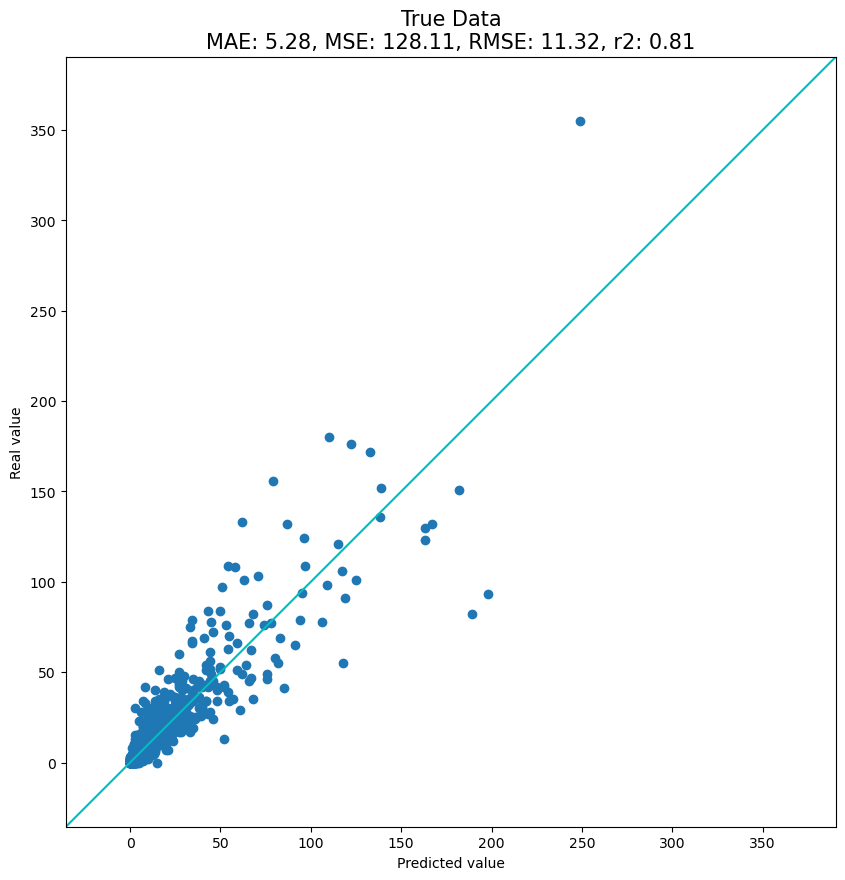

In [18]:
pa_gwr.plot_scatter(save_fig=SAVE_FIGS, root_name=DIR_GWR / "gwr_model")

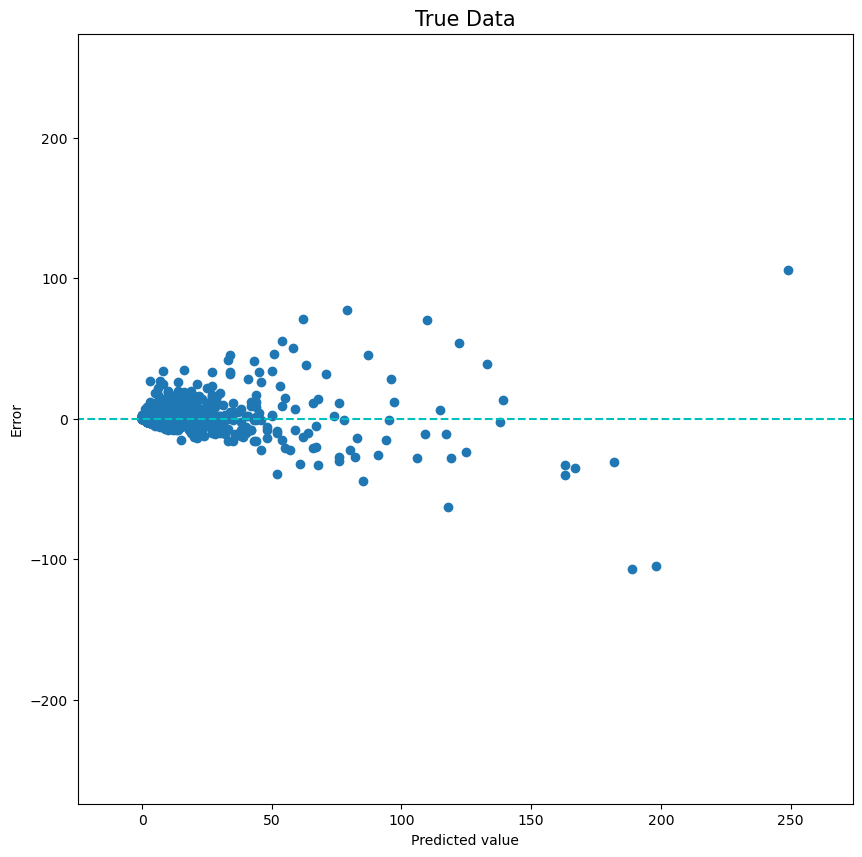

In [19]:
pa_gwr.plot_errors(save_fig=SAVE_FIGS, root_name=DIR_GWR / "gwr_model")

### Original data

In [20]:
y_predicted_transformed = pd.Series(
    y_predicted_transformed.flatten(), name="GWR_predicted_transformed"
)
y_transformed = pd.Series(y_transformed.flatten(), name="GWR_transformed")
pa_gwr_tf = PredictedAccuracy(y_transformed, y_predicted_transformed)

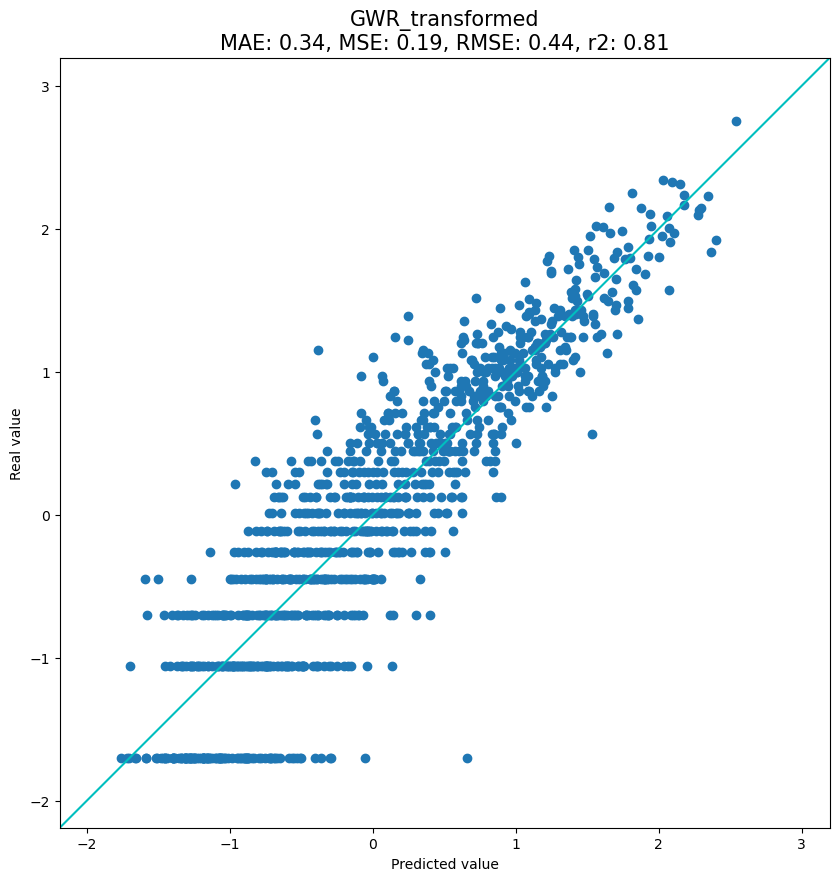

In [21]:
pa_gwr_tf.plot_scatter(save_fig=SAVE_FIGS, root_name=DIR_GWR / "gwr_transformed")

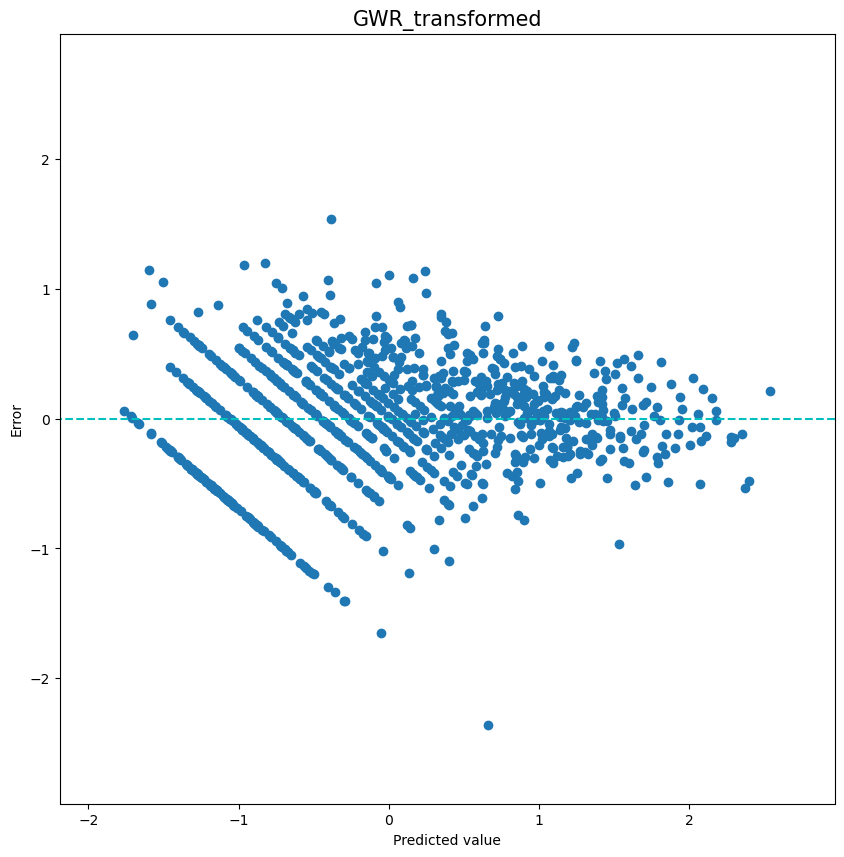

In [22]:
pa_gwr_tf.plot_errors(save_fig=SAVE_FIGS, root_name=DIR_GWR / "gwr_transformed")

# 2nd model

### Load best model (from notebook "01linear")

In [23]:
linear_coefs = pd.read_csv(DIR_MONTH / "01_linear/coefficients.csv", index_col=0)
best_model = linear_coefs.drop(["Intercept"], axis=1).columns

X_chosen = sect[best_model]

print(best_model)

Index(['Distance_Center', 'POI_Restaurants_Hotels', 'Nationality_Italy',
       'Nationality_UK', 'Percentage_Age_65_Plus', 'Percentage_Age_0_14'],
      dtype='object')


## Preprocessing

In [24]:
X_transformed = X_chosen.copy()

if pd.isnull(X_chosen).sum().sum() != 0:
    knn_X = KNNImputer()
    knn_X.fit(X_transformed)
    X_transformed = knn_X.transform(X_transformed)

pw_X = PowerTransformer()
pw_X.fit(X_transformed)
X_transformed = pw_X.transform(X_transformed)

pw_y = PowerTransformer()
pw_y.fit(y_chosen)
y_transformed = pw_y.transform(y_chosen)

### Check multicolinearity

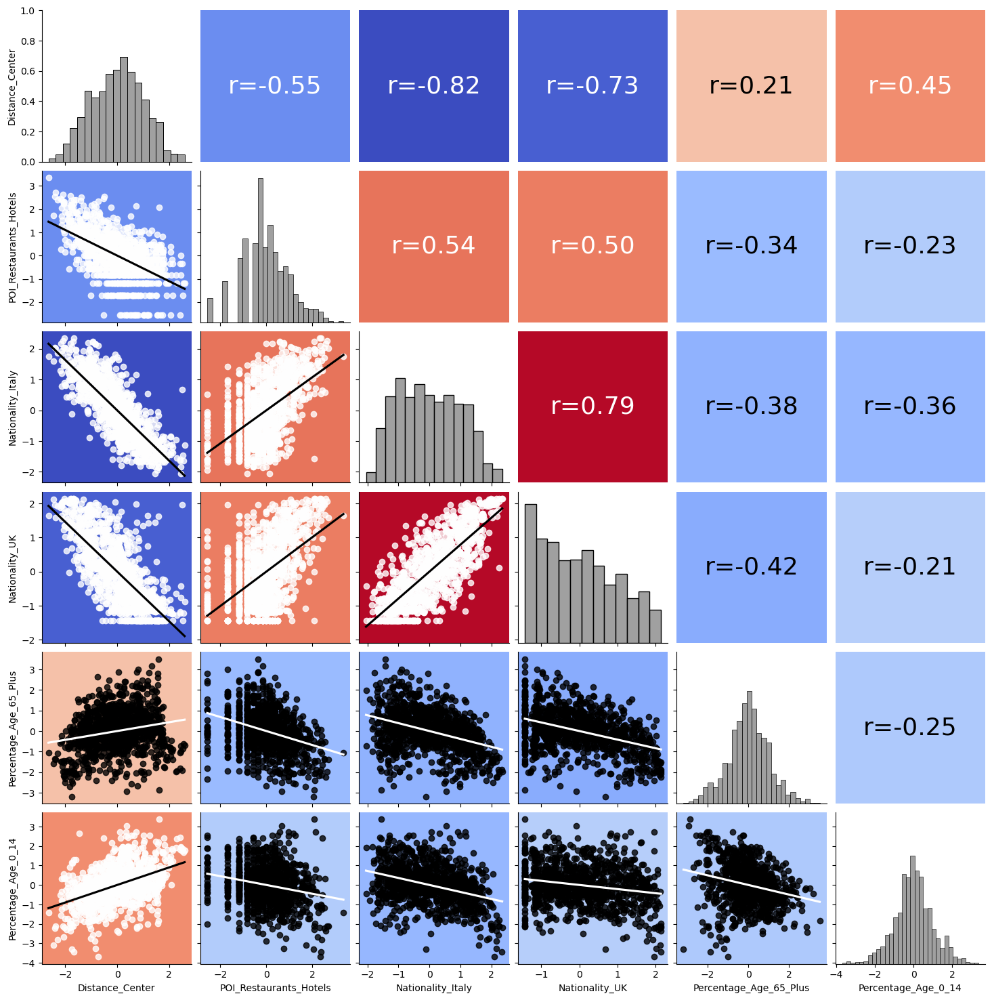

In [25]:
def corrfunc(x, y, **kwds):
    cmap = kwds["cmap"]
    norm = kwds["norm"]
    ax = plt.gca()
    ax.tick_params(bottom=False, top=False, left=False, right=False)
    sns.despine(ax=ax, bottom=True, top=True, left=True, right=True)
    r, _ = pearsonr(x, y)
    facecolor = cmap(norm(r))
    ax.set_facecolor(facecolor)
    lightness = (max(facecolor[:3]) + min(facecolor[:3])) / 2
    ax.annotate(
        f"r={r:.2f}",
        xy=(0.5, 0.5),
        xycoords=ax.transAxes,
        color="white" if lightness < 0.7 else "black",
        size=26,
        ha="center",
        va="center",
    )


def scattfunc(x, y, **kwds):
    cmap = kwds["cmap"]
    norm = kwds["norm"]
    ax = plt.gca()
    r, _ = pearsonr(x, y)
    facecolor = cmap(norm(r))
    lightness = (max(facecolor[:3]) + min(facecolor[:3])) / 2
    myColor = "white" if lightness < 0.7 else "black"
    lineColor = "black" if lightness < 0.7 else "white"
    ax.set_facecolor(facecolor)
    sns.regplot(x=x, y=y, ax=ax, color=myColor, line_kws={"color": lineColor}, ci=None)


g = sns.PairGrid(pd.DataFrame(X_transformed, columns=X_chosen.columns))
g.map_lower(
    scattfunc, cmap=plt.get_cmap("coolwarm"), norm=plt.Normalize(vmin=-0.8, vmax=0.8)
)
g.map_diag(sns.histplot, color="gray", kde=False)
g.map_upper(
    corrfunc, cmap=plt.get_cmap("coolwarm"), norm=plt.Normalize(vmin=-0.8, vmax=0.8)
)
g.fig.subplots_adjust(wspace=0.06, hspace=0.06)  # equal spacing in both directions


if SAVE_FIGS:
    plt.savefig(DIR_GWR / "correlations.svg", format="svg")

In [26]:
vif = pd.DataFrame()
vif["VIF"] = [
    variance_inflation_factor(X_transformed, i) for i in range(X_transformed.shape[1])
]
vif["variable"] = X_chosen.columns

vif

,VIF,variable
0,3.815619,Distance_Center
1,1.578647,POI_Restaurants_Hotels
2,4.354631,Nationality_Italy
3,3.062252,Nationality_UK
4,1.607573,Percentage_Age_65_Plus
5,1.548455,Percentage_Age_0_14


## Model training

### Bandwith selection

In [27]:
gwr_chosen_selector_2 = mgwr.sel_bw.Sel_BW(
    coords, y_transformed, X_transformed, fixed=False, spherical=True, multi=False
)
gwr_bw_2 = gwr_chosen_selector_2.search()
print("GWR with chosen and transformed features")
print("Bandwith (KNN): " + str(int(gwr_bw_2)))

GWR with chosen and transformed features
Bandwith (KNN): 174


### Fit the model

In [28]:
gwr_model_2 = mgwr.gwr.GWR(
    coords, y_transformed, X_transformed, gwr_bw_2, constant=FIT_INTERCEPT
)
gwr_results_2 = gwr_model_2.fit()
gwr_results_2.summary()

Model type                                                         Gaussian
Number of observations:                                                1068
Number of covariates:                                                     7

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                            270.536
Log-likelihood:                                                    -782.172
AIC:                                                               1578.343
AICc:                                                              1580.479
BIC:                                                              -7128.393
R2:                                                                   0.747
Adj. R2:                                                              0.745

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

## Model Evaluation

In [29]:
from sklearn.metrics import r2_score, mean_squared_error, explained_variance_score

gwr_model_2.predict(coords, X_transformed)
y_predicted = gwr_results_2.predictions

y_predicted_transformed = y_predicted.copy()  # Transformed (Gaussian) data
y_predicted = (
    pw_y.inverse_transform(y_predicted).round().flatten().reshape(len(y_predicted), 1)
)

In [30]:
mse = mean_squared_error(y, y_predicted)
rmse = np.sqrt(mse)
r2 = r2_score(y, y_predicted)
n, p = len(y), X_transformed.shape[1]
adjusted_r2 = 1 - (1 - r2) * (n - 1) / (n - p - 1)
evs = explained_variance_score(y, y_predicted)
aic = gwr_results_2.aic

residuals = y - y_predicted

gwr_metrics = {
    "MSE": [mse],
    "RMSE": [rmse],
    "R^2": [r2],
    "Adj R^2": [adjusted_r2],
    "EVs": [evs],
    "AIC": [aic],
}
df_gwr_metrics = pd.DataFrame(gwr_metrics, index=["GWR"])

df_metrics = pd.read_csv("metrics_red.csv", index_col=0)
df_metrics = pd.concat([df_metrics, df_gwr_metrics])
df_metrics.to_csv("metrics_red.csv", index=True)
df_metrics

,MSE,RMSE,R^2,Adj R^2,EVs,AIC
Linear Regression,160.004466,12.649287,0.757999,0.753377,0.762458,5460.315447
GWR,92.873596,9.637095,0.859532,0.858738,0.862931,1481.899846


#### Spatial Autocorrelation handling

##### Moran's I on residuals 

In [31]:
from libpysal.weights import Queen
from esda.moran import Moran


def calculate_morans_i(residuals, geo_info):
    w = Queen.from_dataframe(geo_info)
    w.transform = "R"
    moran = Moran(residuals, w)
    return moran.I, moran.p_sim


moran = calculate_morans_i(residuals, geo_info)
print(f"Moran's I: {moran[0]}, p-value: {moran[1]}")

Moran's I: 0.10160492638709807, p-value: 0.001


##### Cross validation with training and test sets for different sections

In [32]:
from sklearn.model_selection import KFold
from sklearn.pipeline import Pipeline

# Preprocessing Pipelines
feature_pipeline = Pipeline(
    [("imputer", KNNImputer()), ("power_transformer", PowerTransformer())]
)

target_pipeline = Pipeline([("power_transformer", PowerTransformer())])

kf = KFold(n_splits=5, shuffle=True, random_state=42)
mse_scores = []

for train_index, test_index in kf.split(X_chosen):

    X_train, X_test = X_chosen.iloc[train_index], X_chosen.iloc[test_index]
    y_train, y_test = y_chosen[train_index], y_chosen[test_index]
    coords_train, coords_test = coords[train_index], coords[test_index]

    X_train_tr = feature_pipeline.fit_transform(X_train)
    X_test_tr = feature_pipeline.transform(X_test)
    y_train_tr = target_pipeline.fit_transform(y_train.reshape(-1, 1))

    # Model selection and fitting
    gwr_chosen_selector = mgwr.sel_bw.Sel_BW(
        coords_train, y_train_tr, X_train_tr, fixed=False, spherical=True, multi=False
    )
    gwr_bw = gwr_chosen_selector.search()

    gwr_model = mgwr.gwr.GWR(
        coords_train, y_train_tr, X_train_tr, gwr_bw, constant=True
    )
    gwr_results = gwr_model.fit()

    # Predicting over the test dataset
    gwr_pred_test = gwr_model.predict(coords_test, X_test_tr)

    y_test_pred_tr = gwr_pred_test.predictions
    y_test_pred = (
        target_pipeline.inverse_transform(y_test_pred_tr)
        .round()
        .flatten()
        .reshape(len(y_test_pred_tr), 1)
    )

    # Evaluate model
    mse_test = mean_squared_error(y_test, y_test_pred)
    mse_scores.append(mse_test)

mean_mse = np.mean(mse_scores)
print(f"Mean MSE across folds: {mean_mse}")

Mean MSE across folds: 120.86795664955464


In [33]:
autocorr_metrics = {"Moran's I": [moran[0]], "Mean MSE": [mean_mse]}
df_autocorr_gwr_metrics = pd.DataFrame(autocorr_metrics, index=["GWR"])

df_autocorr_metrics = pd.read_csv("metrics_autocorr_red.csv", index_col=0)
df_autocorr_metrics = pd.concat([df_autocorr_metrics, df_autocorr_gwr_metrics])
df_autocorr_metrics.to_csv("metrics_autocorr_red.csv", index=True)
df_autocorr_metrics

,Moran's I,Mean MSE
Linear Regression,0.214738,178.444837
GWR,0.101605,120.867957


## Results Visualization

### Local $R^2$ ($R^2$ of each regression)

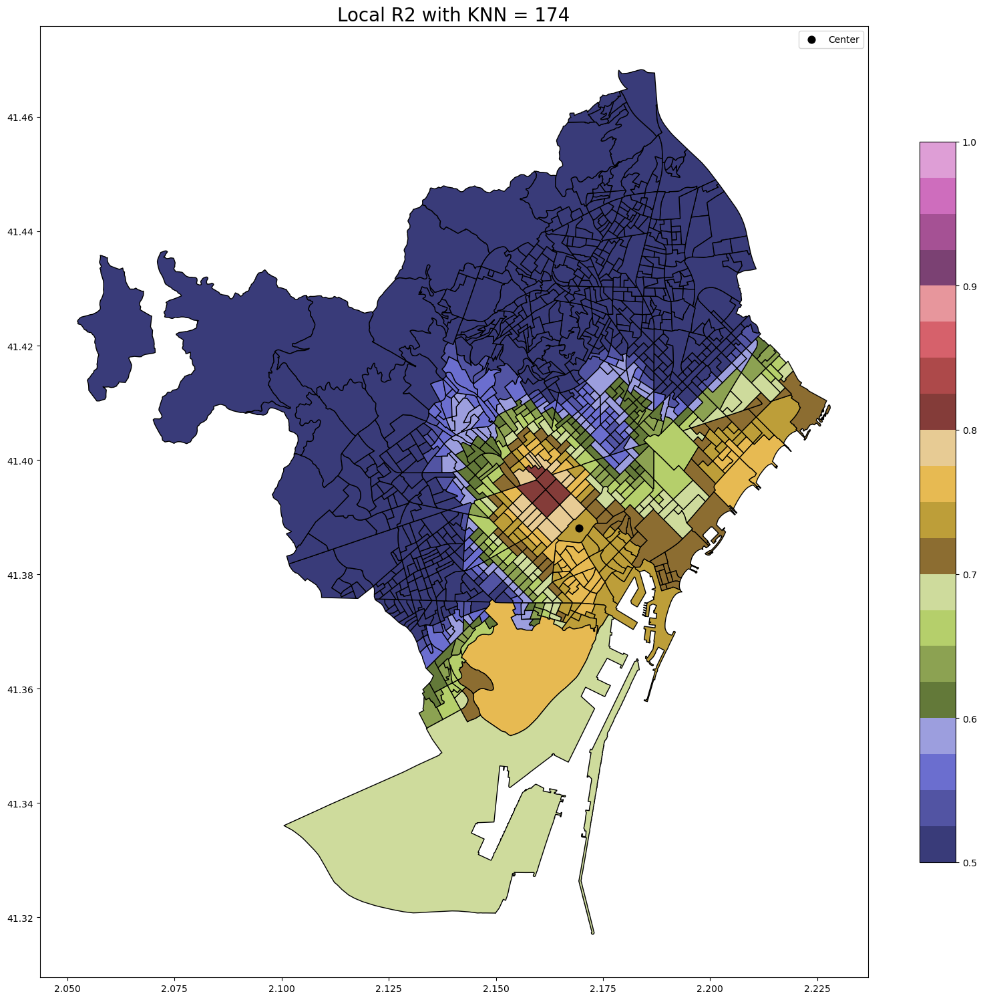

In [34]:
geo_info["Chosen_Local_R2"] = gwr_results_2.localR2

id_max_airbnb = geo_info[VARIABLE_TO_PREDICT].idxmax()

# Plot
fig, ax = plt.subplots(figsize=(20, 20))
geo_info.plot(
    ax=ax,
    edgecolor="black",
    column="Chosen_Local_R2",
    legend=True,
    vmin=0.5,
    vmax=1,
    cmap="tab20b",
    legend_kwds={"shrink": 0.7},
)
geo_info[geo_info.index == id_max_airbnb].centroid.plot(
    ax=ax, color="black", markersize=60, label="Center"
)

plt.legend()

ax.set_title(
    "Local R2 with KNN = {}".format(int(gwr_bw_2)),
    fontsize=20,
)

if SAVE_FIGS:
    plt.savefig(DIR_GWR / "local_r2.svg", format="svg")

plt.show()

### Relative errors

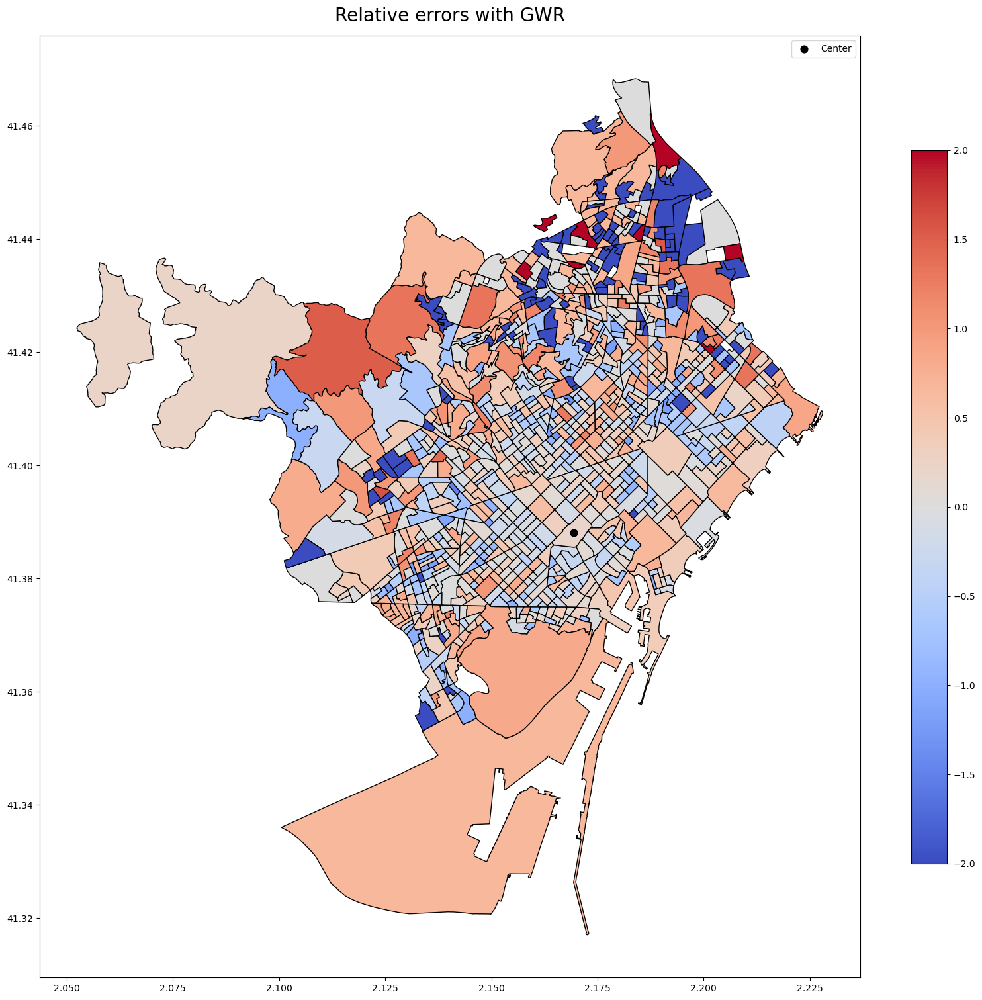

In [35]:
geo_info["Chosen_Error"] = (
    2
    * (np.array(y_truth) - y_predicted.flatten())
    / (abs(np.array(y_truth)) + abs(y_predicted.flatten()))
)

col_lim = max(abs(geo_info["Chosen_Error"].min()), abs(geo_info["Chosen_Error"].max()))

# Plot
fig, ax = plt.subplots(figsize=(20, 20))
geo_info.plot(
    ax=ax,
    edgecolor="black",
    column="Chosen_Error",
    legend=True,
    vmin=-col_lim,
    vmax=col_lim,
    cmap="coolwarm",
    legend_kwds={"shrink": 0.7},
)

geo_info[geo_info.index == id_max_airbnb].centroid.plot(
    ax=ax, color="black", markersize=60, label="Center"
)

plt.legend()

ax.set_title("Relative errors with GWR", fontsize=20, y=1.01)

if SAVE_FIGS:
    plt.savefig(DIR_GWR / "relative_errors.svg", format="svg")

plt.show()

### Areas of importance of each feature

In [36]:
gwr_columns = best_model.copy()
if FIT_INTERCEPT:
    gwr_columns = gwr_columns.insert(0, "Intercept")
coefs_gwr = pd.DataFrame(gwr_results_2.params, columns=gwr_columns)

medians_gwr = coefs_gwr.median()
medians_gwr = medians_gwr.reindex(medians_gwr.abs().sort_values(ascending=False).index)
coefs_gwr = coefs_gwr[medians_gwr.index]

limit_value = (
    max(abs(coefs_gwr.to_numpy().min()), abs(coefs_gwr.to_numpy().max())) * 1.05
)

print(gwr_columns)

# Copy coefficients in geodatagrame to plot
for col in coefs_gwr.columns:
    #     if col != "Intercept":
    #     if True:
    geo_coefs[col] = coefs_gwr[col].values

# Get t-vals of coefficientes
gwr_filtered_t = pd.DataFrame(gwr_results_2.filter_tvals(), columns=gwr_columns)
gwr_filtered_t.index = geo_info.index

# Copy coefficients in new dataframe so non-significant can later be removed
geo_significant_coefs = geo_coefs.copy()

Index(['Intercept', 'Distance_Center', 'POI_Restaurants_Hotels',
       'Nationality_Italy', 'Nationality_UK', 'Percentage_Age_65_Plus',
       'Percentage_Age_0_14'],
      dtype='object')


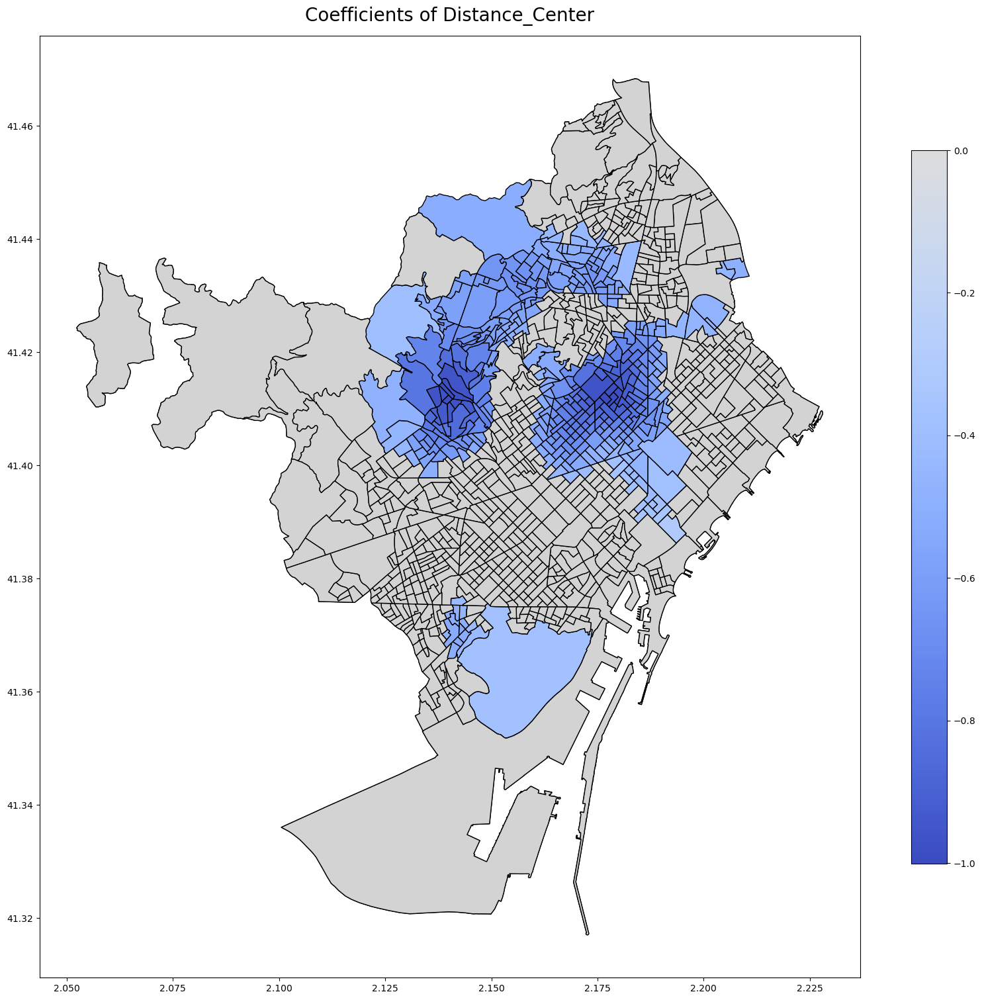

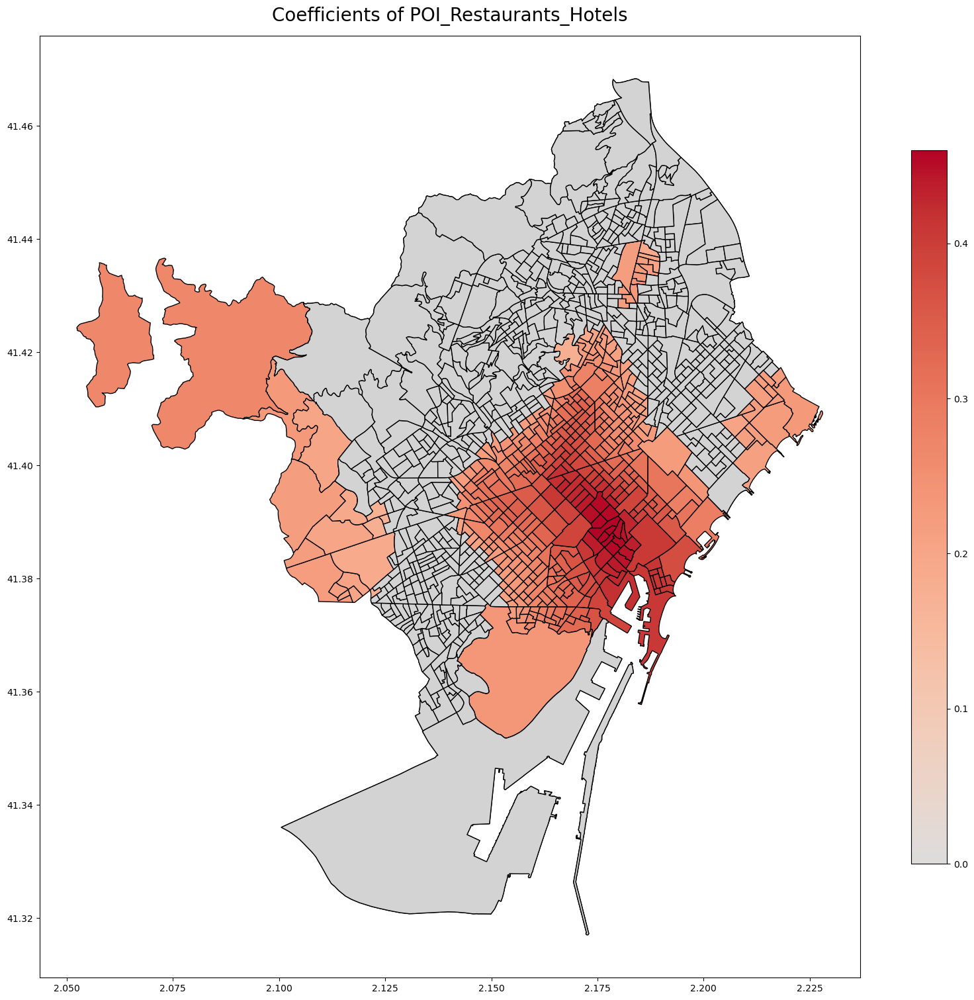

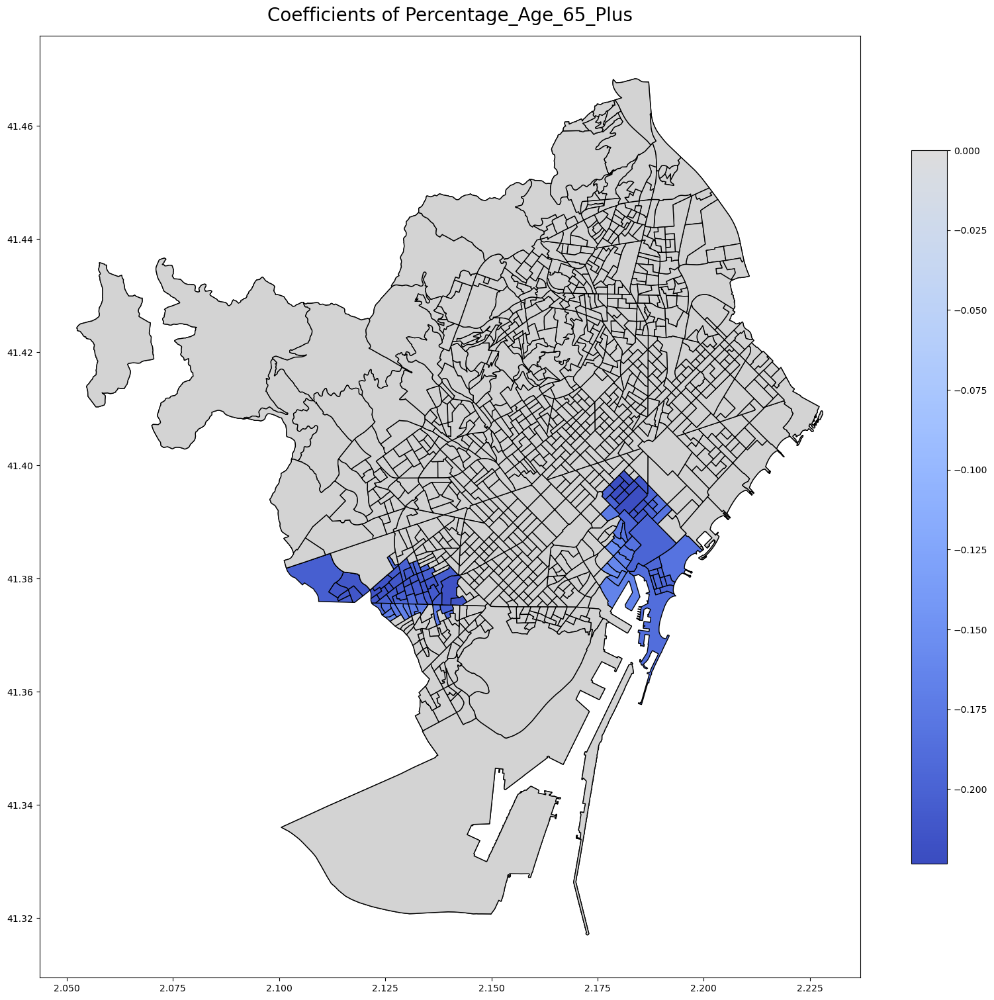

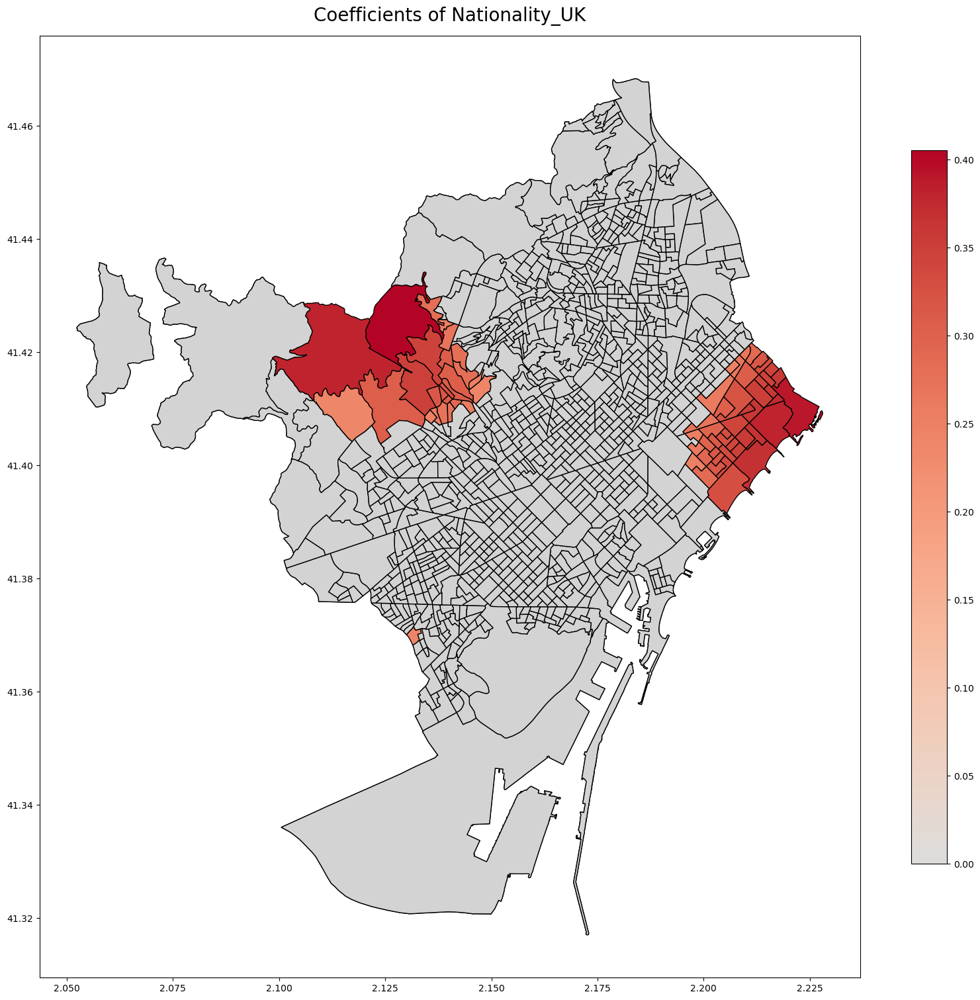

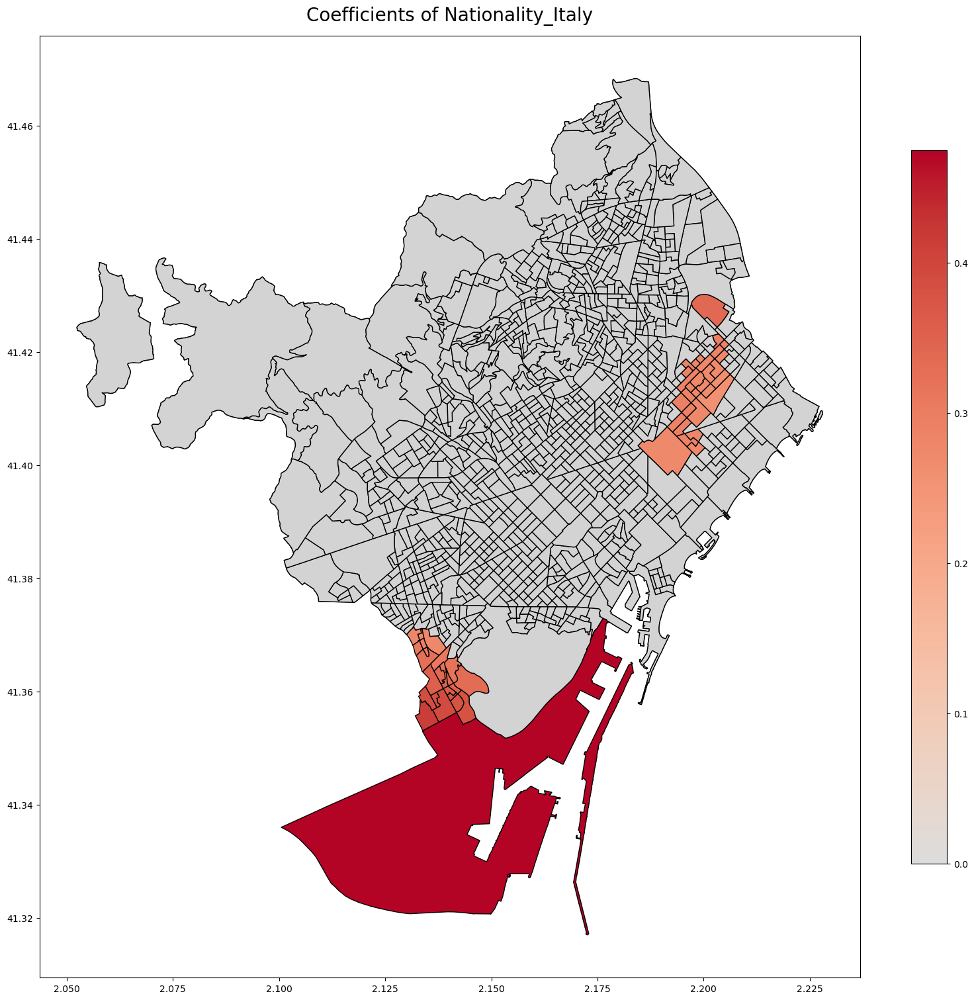

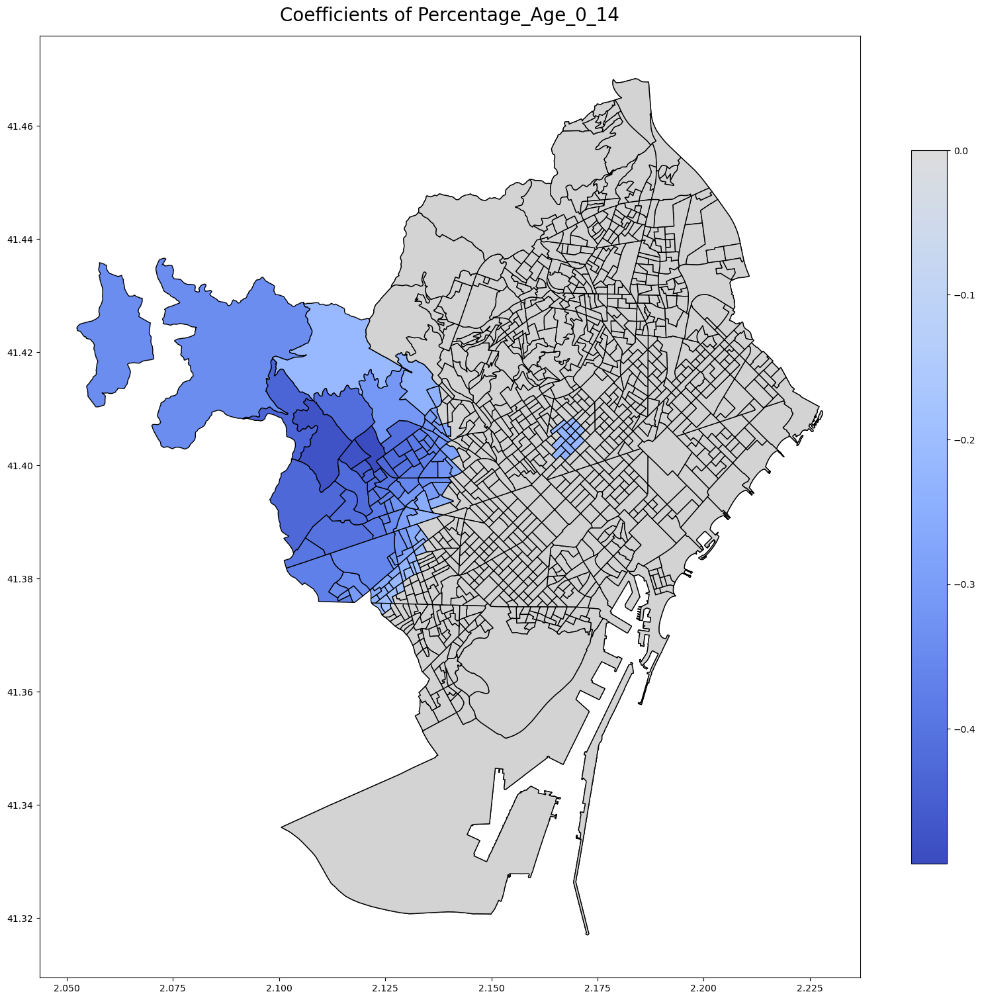

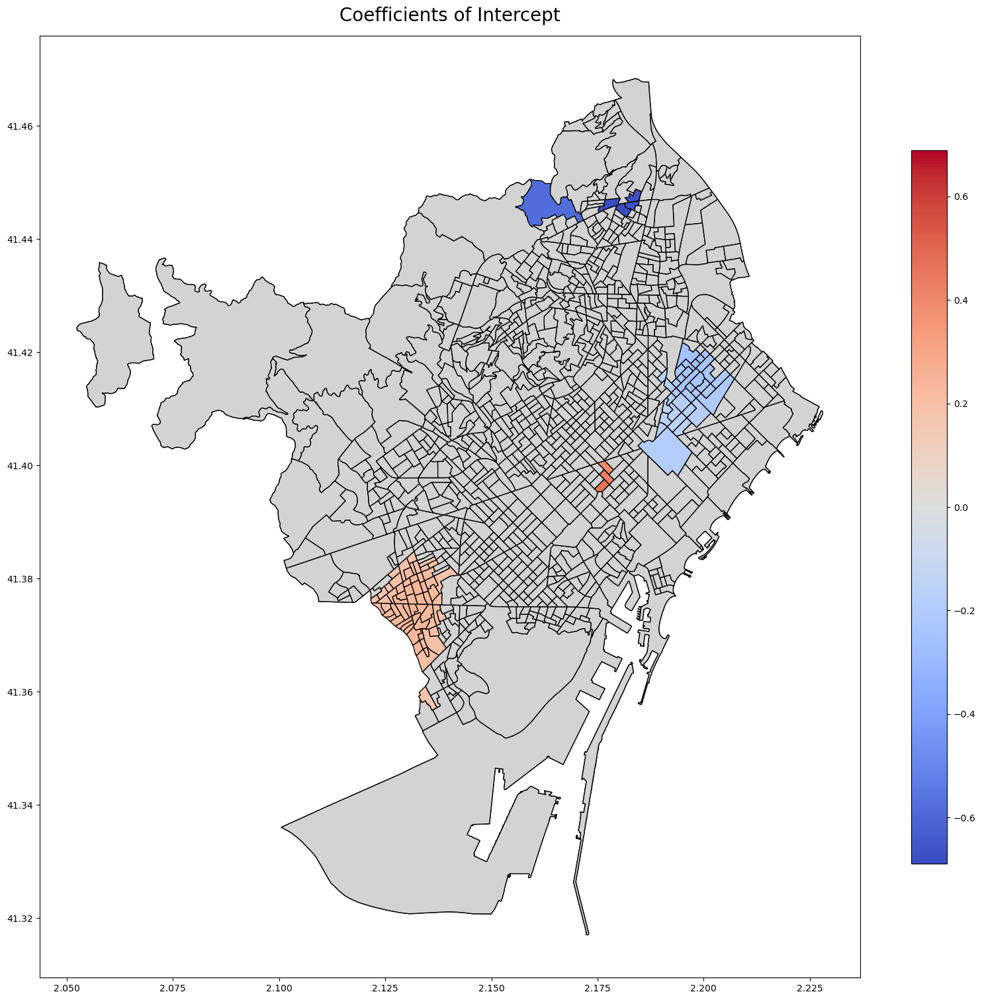

In [37]:
for col in coefs_gwr.columns:
    fig, ax = plt.subplots(figsize=(20, 20))
    min_coef = geo_coefs[gwr_filtered_t.loc[:, col] != 0][col].min()
    max_coef = geo_coefs[gwr_filtered_t.loc[:, col] != 0][col].max()

    cool_warm_cmap = plt.cm.coolwarm

    if min_coef < 0 and max_coef < 0:
        interval = np.linspace(0, 0.5)
        colors = cool_warm_cmap(interval)
        cool_warm_cmap = mpl.colors.LinearSegmentedColormap.from_list("name", colors)
        vmin = min_coef
        vmax = 0
    elif min_coef > 0 and max_coef > 0:
        interval = np.linspace(0.5, 1)
        colors = cool_warm_cmap(interval)
        cool_warm_cmap = mpl.colors.LinearSegmentedColormap.from_list("name", colors)
        vmin = 0
        vmax = max_coef
    else:
        vmax = max(abs(min_coef), abs(max_coef))
        vmin = -vmax

    geo_coefs.plot(
        ax=ax,
        edgecolor="black",
        column=col,
        legend=True,
        vmin=vmin,
        vmax=vmax,
        cmap=cool_warm_cmap,
        legend_kwds={"shrink": 0.7},
    )
    if (gwr_filtered_t.loc[:, col] == 0).any():
        geo_info[gwr_filtered_t.loc[:, col] == 0].plot(
            color="lightgrey", ax=ax, **{"edgecolor": "black"}
        )
        temp = geo_significant_coefs[[col]]
        temp[gwr_filtered_t.loc[:, col] == 0] = np.nan
        geo_significant_coefs[col] = temp[col]

    ax.set_title("Coefficients of {}".format(col), fontsize=20, y=1.01)

    if SAVE_FIGS:
        plt.savefig(
            DIR_GWR / "coefficients/{}.svg".format(col),
            format="svg",
        )

    plt.show()

### Statistics about each feature and section

In [38]:
significant_coefs_gwr = geo_significant_coefs.drop(["geometry"], axis=1)

limit_value = (
    max(
        np.nanmin(abs(significant_coefs_gwr.to_numpy())),
        np.nanmax(abs(significant_coefs_gwr.to_numpy())),
    )
    * 1.05
)

if FIT_INTERCEPT:
    medians_gwr = significant_coefs_gwr.drop(["Intercept"], axis=1).median()
else:
    medians_gwr = significant_coefs_gwr.median()

medians_gwr = medians_gwr.reindex(medians_gwr.abs().sort_values(ascending=False).index)

if FIT_INTERCEPT:
    medians_gwr["Intercept"] = 0

significant_coefs_gwr = significant_coefs_gwr[medians_gwr.index]

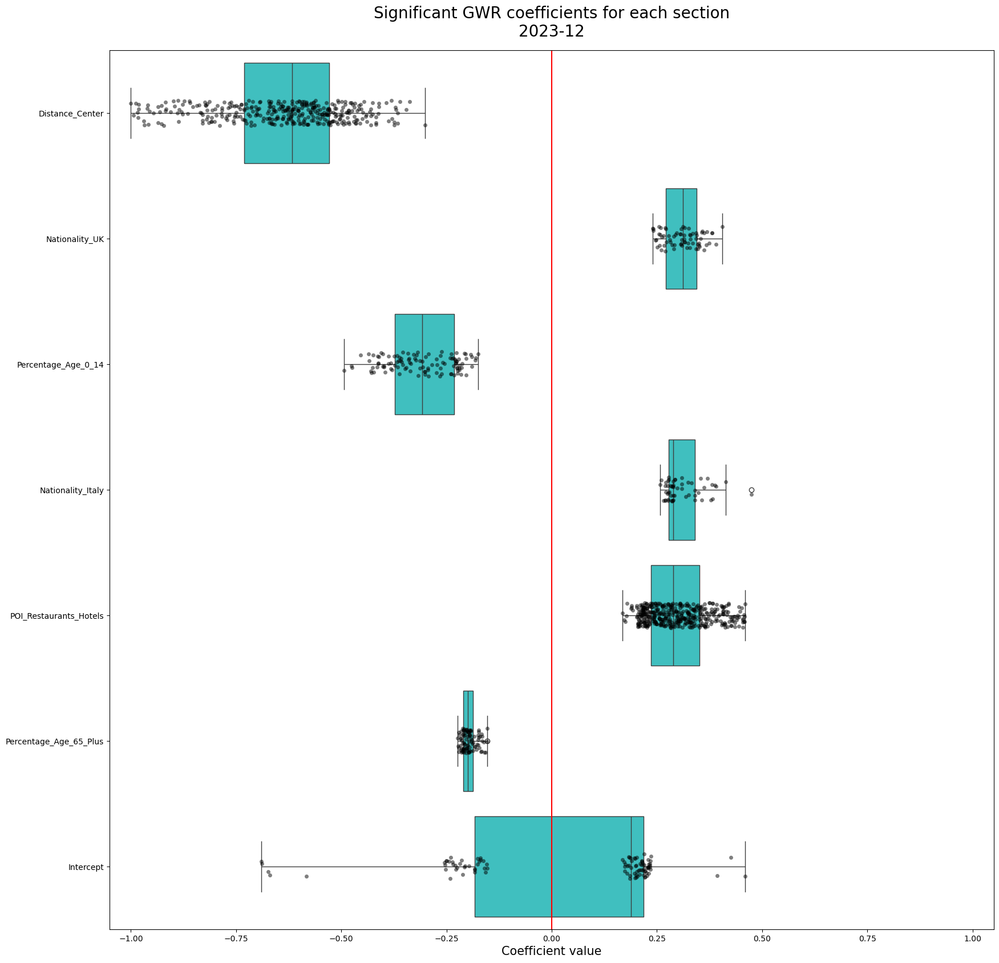

In [39]:
fig, ax = plt.subplots(figsize=(20, 20))

sns.stripplot(
    ax=ax,
    data=significant_coefs_gwr,
    orient="h",
    color="k",
    alpha=0.5,
)
sns.boxplot(
    ax=ax,
    data=significant_coefs_gwr,
    orient="h",
    color="cyan",
    saturation=0.5,
)
plt.axvline(x=0, color="red")

ax.set_title(
    "Significant GWR coefficients for each section\n{}-{:02d}".format(YEAR, MONTH),
    fontsize=20,
    y=1.01,
)
ax.set_xlim(-limit_value, limit_value)
ax.set_xlabel("Coefficient value", fontsize=15)

if SAVE_FIGS:
    plt.savefig(DIR_GWR / "gwr_significant_coefficients.svg", format="svg")

plt.show()

In [40]:
significant_count = pd.DataFrame(
    [significant_coefs_gwr.count().index, significant_coefs_gwr.count().values]
).T
significant_count.columns = ["Features", "Percentage"]
significant_count["Percentage"] = significant_count["Percentage"] / X.shape[0]

significant_count.sort_values(by=["Percentage"], ascending=False, inplace=True)

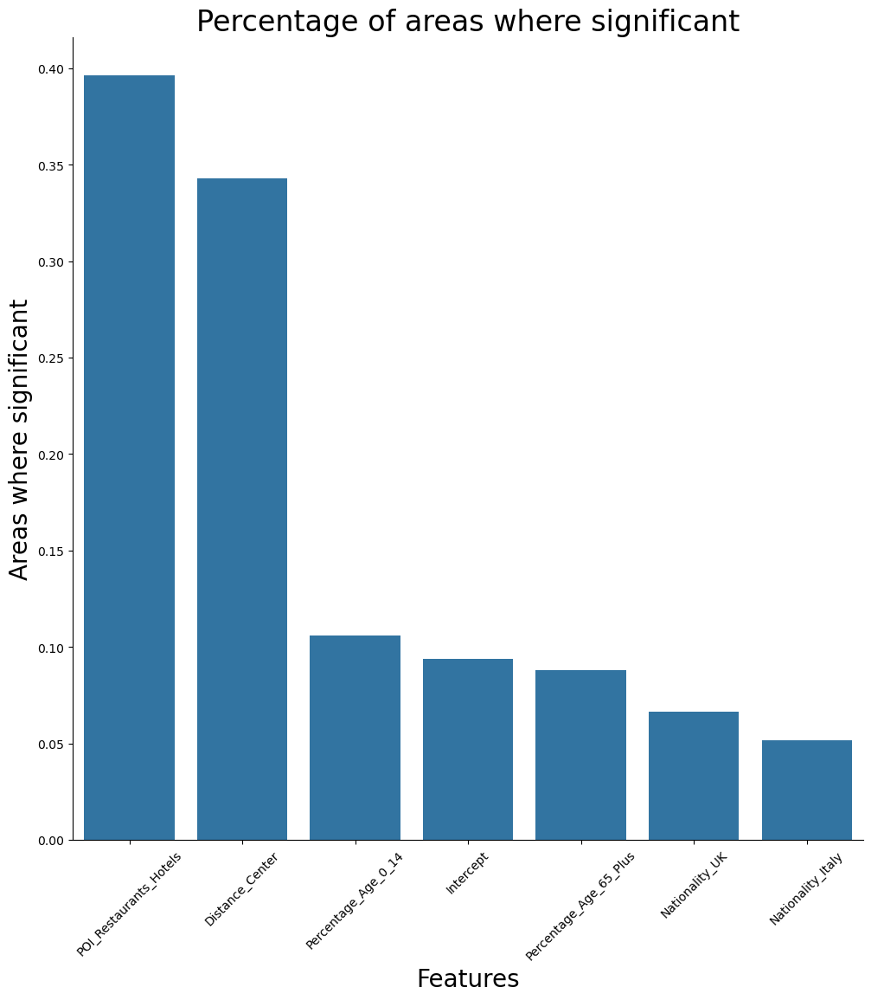

In [41]:
g = sns.catplot(
    ax=ax,
    x="Features",
    y="Percentage",
    kind="bar",
    data=significant_count,
    height=10,
    aspect=1,
)

# g.set_title("Significancy of features", fontsize=50)
plt.xlabel("Features", fontsize=20)
plt.ylabel("Areas where significant", fontsize=20)
plt.xticks(rotation=45)
plt.title("Percentage of areas where significant", size=24)

if SAVE_FIGS:
    g.savefig(DIR_GWR / "significant_counts.svg", format="svg")

plt.show()

In [42]:
area_count = pd.DataFrame(
    [significant_coefs_gwr.index, significant_coefs_gwr.T.count().values]
).T
area_count.columns = ["Area", "Count"]
area_count.set_index("Area", inplace=True)
geo_info["Area_Count"] = area_count["Count"]

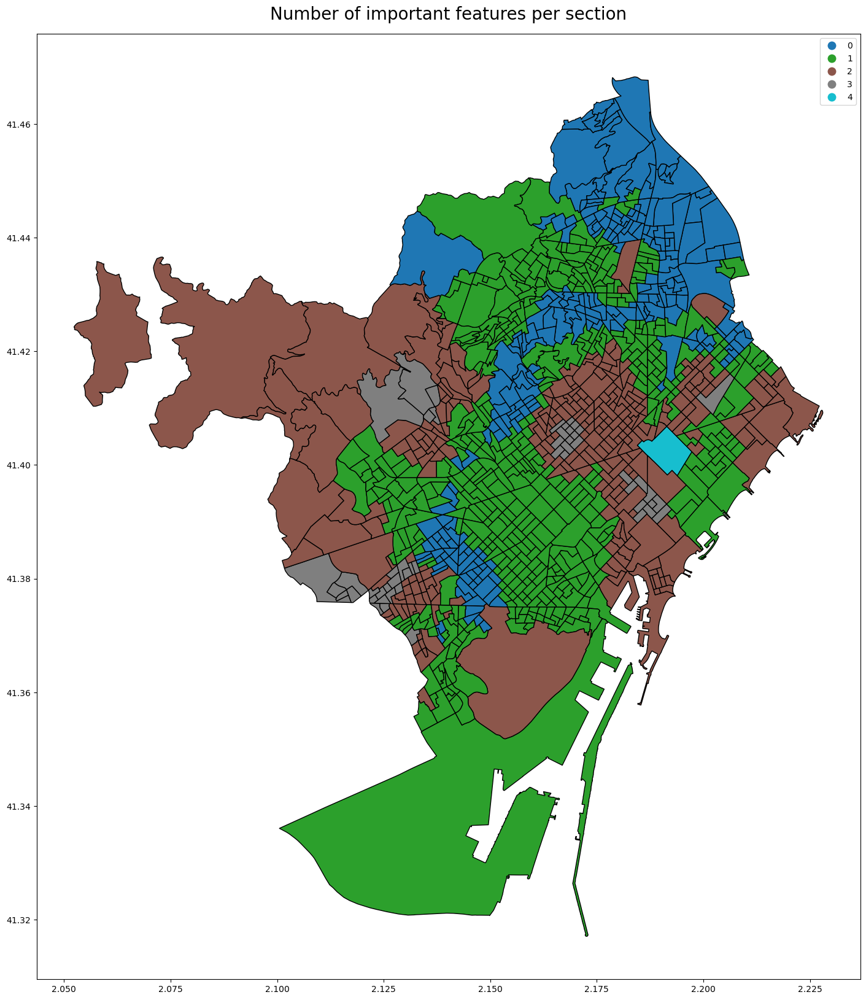

In [43]:
fig, ax = plt.subplots(figsize=(20, 20))
geo_info.plot(
    ax=ax,
    edgecolor="black",
    column="Area_Count",
    legend=True,
    #     vmin=0.5,
    #     vmax=1,
    cmap="tab10",
    #     legend_kwds={"shrink": 0.7},
)

ax.set_title("Number of important features per section", fontsize=20, y=1.01)

# geo_info[geo_info[VARIABLE_TO_PREDICT] == 0].centroid.plot(ax=ax, color="red")

if SAVE_FIGS:
    plt.savefig(DIR_GWR / "number_features.svg", format="svg")

plt.show()

In [44]:
geo_info["Chosen_Most_Important"] = (
    significant_coefs_gwr.fillna(0).abs().idxmax(axis=1).values
)

temp = geo_info["Chosen_Most_Important"]
temp[significant_coefs_gwr.fillna(0).abs().max(axis=1) == 0] = "!NONE"
geo_info["Chosen_Most_Important"] = temp

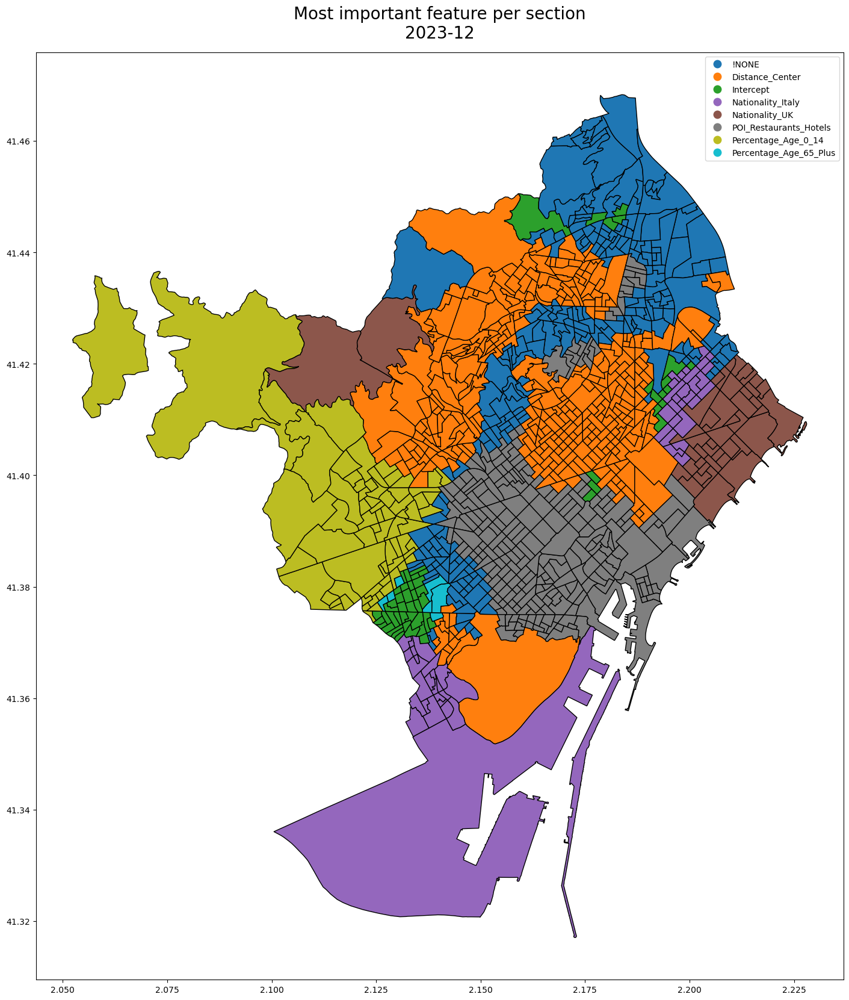

In [45]:
fig, ax = plt.subplots(figsize=(20, 20))
geo_info.plot(
    ax=ax,
    edgecolor="black",
    column="Chosen_Most_Important",
    legend=True,
)

ax.set_title(
    "Most important feature per section\n{}-{:02d}".format(YEAR, MONTH),
    fontsize=20,
    y=1.01,
)

if SAVE_FIGS:
    plt.savefig(DIR_GWR / "important_features.svg", format="svg")


plt.show()

### Model comparison: linear vs GWR

In [46]:
comparison = []
comparison_names = []
for col in significant_coefs_gwr.columns:
    comparison.append(significant_coefs_gwr[col].dropna().values)
    comparison.append(linear_coefs[col].values)
    comparison_names.append("GWR - {}".format(col))
    comparison_names.append("Linear - {}".format(col))


df_comparison = pd.DataFrame(comparison).T
df_comparison.columns = [col for col in comparison_names]

limit_value = (
    max(
        np.nanmin(abs(df_comparison.to_numpy())),
        np.nanmax(abs(df_comparison.to_numpy())),
    )
    * 1.05
)

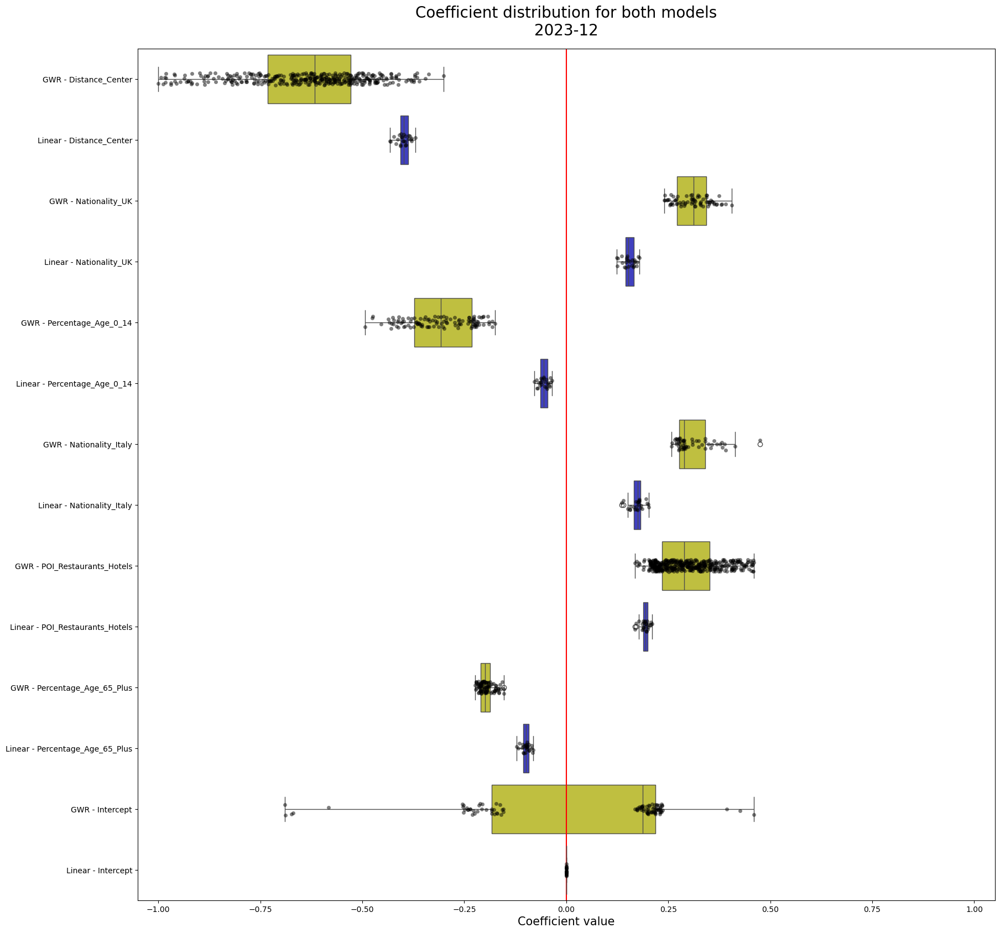

In [47]:
fig, ax = plt.subplots(figsize=(20, 20))

sns.stripplot(
    ax=ax,
    data=df_comparison,
    orient="h",
    color="k",
    alpha=0.5,
)

pal = {
    col: "yellow" if col.startswith("GWR") else "blue" for col in df_comparison.columns
}

sns.boxplot(
    ax=ax,
    data=df_comparison,
    orient="h",
    palette=pal,
    saturation=0.5,
)

plt.axvline(x=0, color="red")

ax.set_title(
    "Coefficient distribution for both models\n{}-{:02d}".format(YEAR, MONTH),
    fontsize=20,
    y=1.01,
)
ax.set_xlim(-limit_value, limit_value)
ax.set_xlabel("Coefficient value", fontsize=15)

if SAVE_FIGS:
    plt.savefig(DIR_GWR / "model_comparison.svg", format="svg")
#     plt.savefig(DIR_GWR / "model_comparison.jpg")


plt.show()